## Plots primarily for GBO
Title: The Galactic Life Cycle: constraining the 3D structure of the Gum Nebula and its associated IRAS Vela shell

In [5]:
import numpy as np
from scipy.ndimage import gaussian_filter1d
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from matplotlib.colors import AsinhNorm

from astropy.coordinates import SkyCoord, GalacticLSR
from astropy.wcs import WCS
from astropy.io import fits
from astropy import units as u
import pandas as pd
# plt.rcParams.update({
#     "font.family": "serif",
#     "font.size": 15
# })


%config InlineBackend.figure_format='retina' # very useful command for high-res images

In [2]:
# pip install --upgrade astropy

##  <font color= '1E90FF'> 1- Map of the sky, and Gum Nebula region </font>

## <font color='9357C2'>H$\alpha$ map</font>

In [2]:
filename = '/Users/anniegao/Documents/dustmaps_files/Dust_maps/AllSky-Halpha_map.fits'
hdu_ha = fits.open(filename)[0]
wcs_ha = WCS(hdu_ha.header)

the PROJPn keyword is deprecated, use PVi_ma. [astropy.wcs.wcs]
the PROJPn keyword is deprecated, use PVi_ma. [astropy.wcs.wcs]


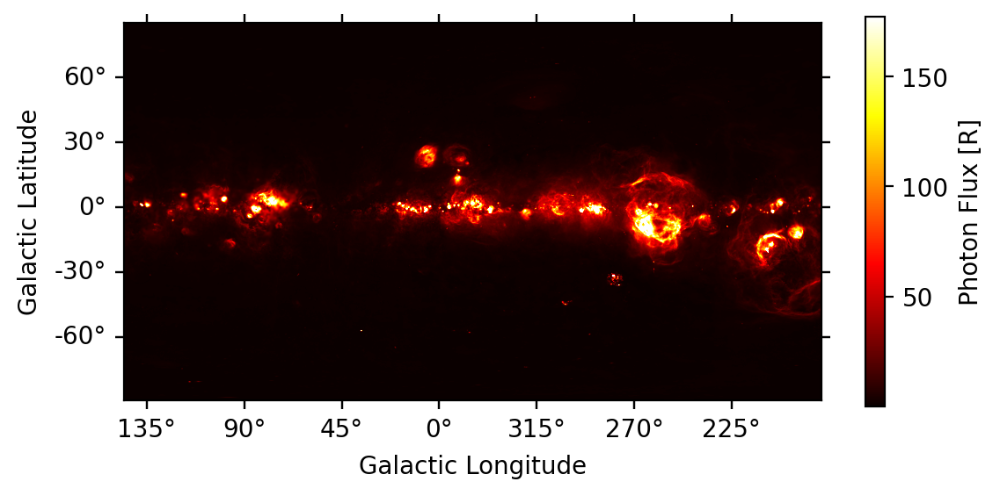

In [84]:
ax = plt.subplot(projection=wcs_ha)
lon = ax.coords[0]
lat = ax.coords[1]
lon.set_major_formatter('dd')
lat.set_major_formatter('dd')
lon.set_ticks([135, 90, 45, 0, 315, 270, 225] * u.degree)
im = ax.imshow(hdu_ha.data, vmin=0.05, vmax=177, origin='lower',cmap='hot')
cbar = plt.colorbar(im, shrink=0.6)
cbar.set_label('Photon Flux [R]')
ax.set_xlim(823, 8558)
ax.set_ylim(15, 4204)
ax.set_xlabel('Galactic Longitude')
ax.set_ylabel('Galactic Latitude')

# ax.set_title('abc')
# ax.coords.grid(True, color='white', ls='solid')
# plt.savefig('/Users/anniegao/Documents/GBO/plots/allsky_halpha1.png',dpi=300, bbox_inches='tight')  

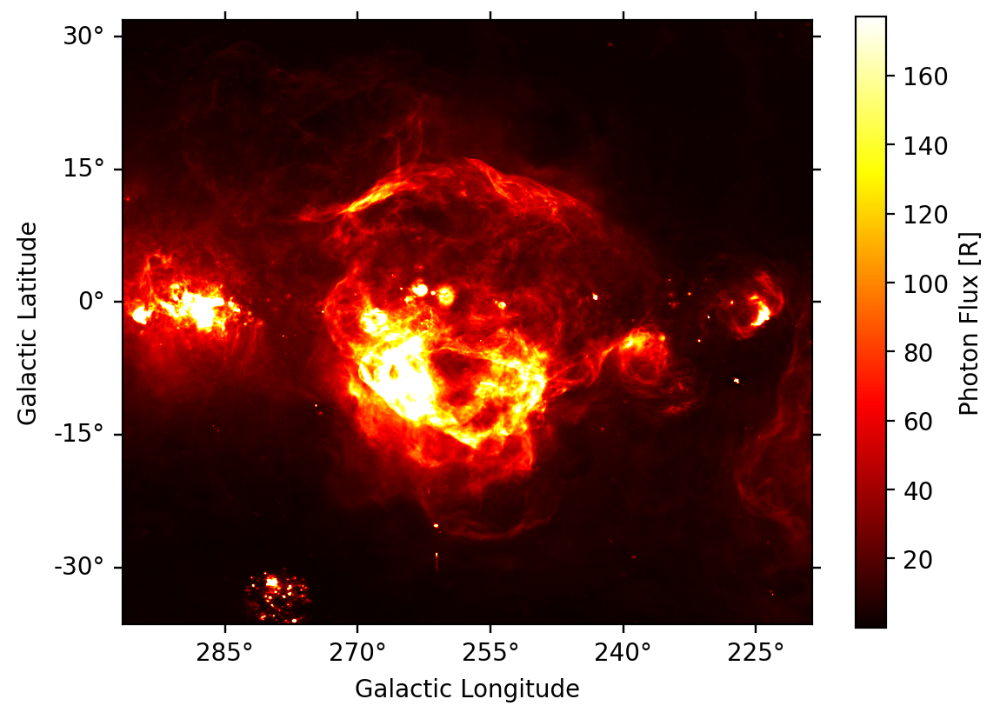

In [85]:
from astropy.visualization import ImageNormalize
ax = plt.subplot(projection=wcs_ha)
im = ax.imshow(hdu_ha.data, vmin=0.05, vmax=177, origin='lower', cmap='hot')
cbar = plt.colorbar(im, shrink=0.95)
cbar.set_label('Photon Flux [R]')
ax.set_xlim(5840.47, 7713)
ax.set_ylim(1285, 2925)
ax.set_xlabel('Galactic Longitude')
ax.set_ylabel('Galactic Latitude')
# ax.coords.grid(True, color='white')
# plt.savefig('/Users/anniegao/Documents/GBO/plots/gum_halpha.png',dpi=300,bbox_inches='tight')  

## <font color='9357C2'>IRAS 60 micron</font>
IRAS: study the sky in IR light (780nm-1mm) 

In [5]:
IRAS = '/Users/anniegao/Documents/dustmaps_files/Dust_maps/IRAS_60microns.fits'
hdu_iras = fits.open(IRAS)[0]
wcs_iras = WCS(hdu_iras.header)

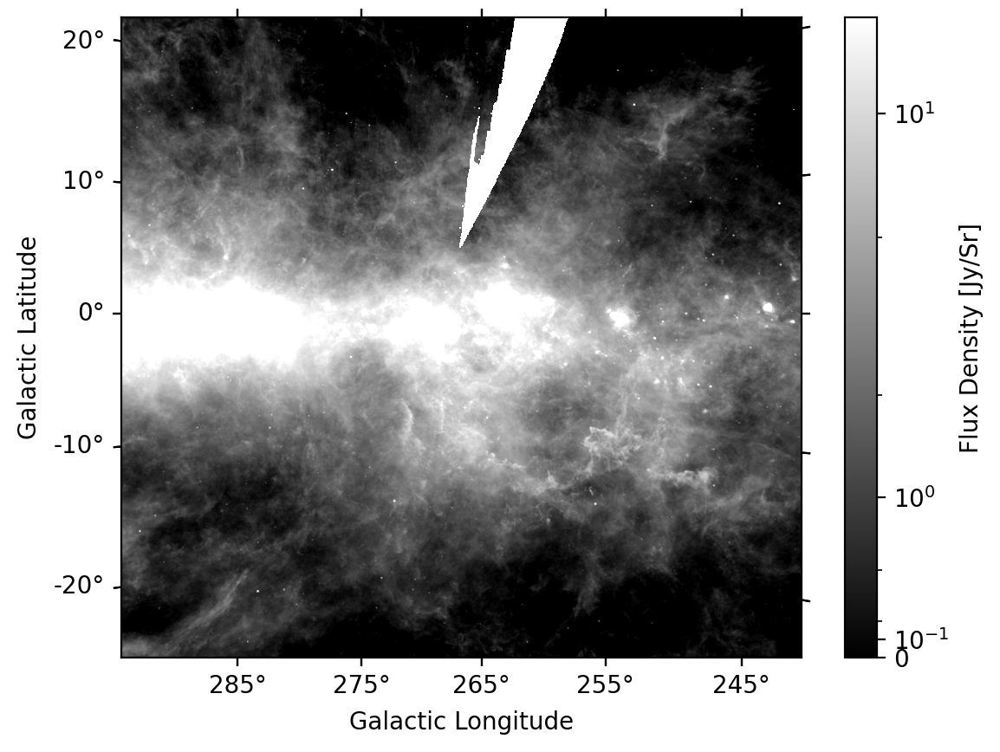

In [88]:
fig = plt.figure()
ax = fig.add_subplot(projection=wcs_iras)
lon = ax.coords[0]
lat = ax.coords[1]
lon.set_major_formatter('dd')
lat.set_major_formatter('dd')
lon.set_ticks([285,275, 265, 255, 245] * u.degree)
im = ax.imshow(hdu_iras.data, norm=AsinhNorm(vmin=0, vmax=17, clip=True), origin='lower',cmap='gray')
cbar = plt.colorbar(im) #ticks=[1e-1, 1, 2, 3.0]
cbar.set_label('Flux Density [Jy/Sr]')
ax.set_xlim(150, 1285)
ax.set_ylim(76, 1145)
ax.set_xlabel('Galactic Longitude')
ax.set_ylabel('Galactic Latitude')
# ax.coords.grid(True, color='white', ls='solid')
# plt.savefig('/Users/anniegao/Documents/GBO/plots/gum_iras.png',dpi=300,bbox_inches='tight')  

## <font color='9357C2'>H$\alpha$ and IRAS side-by-side </font>

In [66]:
# array, footprint = reproject_interp(hdu_iras, hdu_ha.header)

the PROJPn keyword is deprecated, use PVi_ma. [astropy.wcs.wcs]
the PROJPn keyword is deprecated, use PVi_ma. [astropy.wcs.wcs]


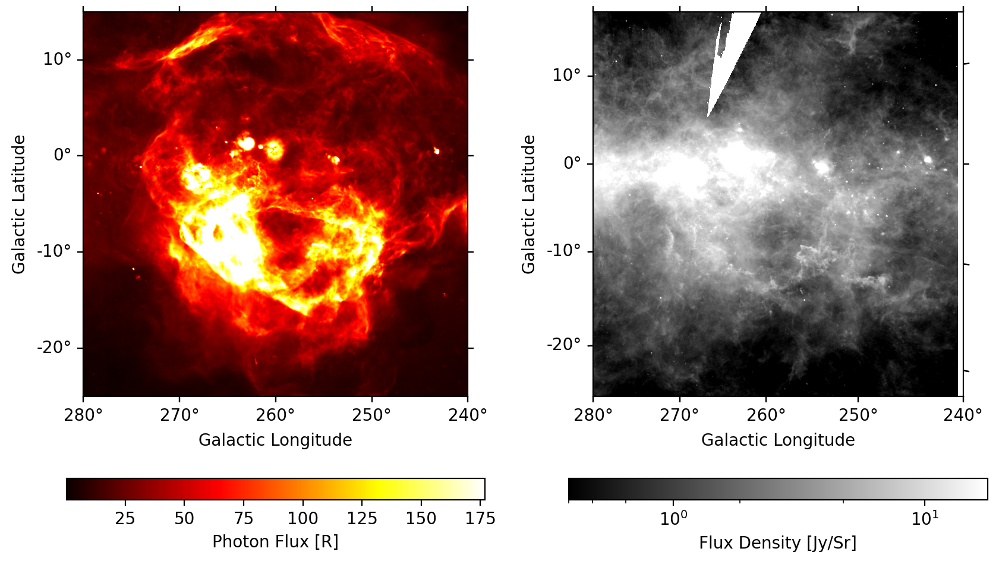

In [87]:
# (ax1, ax2)= plt.subplots(nrows=1, ncols=2) # , sharey= True, tight_layout=True
f = plt.figure(figsize=(10,6))
ax1 = f.add_subplot(121 ,projection=wcs_ha)
ax2 = f.add_subplot(122,  projection=wcs_iras)

# ax1 = plt.subplot(1, 2, 1, projection=wcs_ha)
im1 = ax1.imshow(hdu_ha.data, vmin=0.05, vmax=177, origin='lower', cmap='hot')
cbar = plt.colorbar(im1,orientation='horizontal') #, shrink=0.95
cbar.set_label('Photon Flux [R]')
x1lims_world = [280, 240]*u.degree
y1lims_world = [-25, 15]*u.degree
world_coords1 = SkyCoord(frame="galactic", l = x1lims_world, b = y1lims_world)
pixel_coords_x1, pixel_coords_y1 =wcs_ha.world_to_pixel(world_coords1)
ax1.set_xlim(pixel_coords_x1) #(6200, 7300)
ax1.set_ylim(pixel_coords_y1) #(1540, 2750)
ax1.coords[0].set_axislabel('Galactic Longitude')
ax1.coords[1].set_axislabel('Galactic Latitude')
ax1.coords[0].set_major_formatter('dd')
ax1.coords[1].set_major_formatter('dd')
ax1.coords[1].set_ticks([-20, -10, 0, 10, 20] * u.degree)
ax1.set_aspect('equal')

# ax2 = plt.subplot(1,2,2, projection=wcs_iras)
im2 = ax2.imshow(hdu_iras.data, norm=AsinhNorm(vmin=0, vmax=17, clip=True), origin='lower',cmap='gray')
x2lims_world = [280, 240]*u.degree
y2lims_world = [-25, 15]*u.degree
world_coords2 = SkyCoord(frame="galactic", l = x2lims_world, b = y2lims_world)
pixel_coords_x2, pixel_coords_y2 =wcs_iras.world_to_pixel(world_coords2)
ax2.set_xlim(pixel_coords_x2) #(6200, 7300)
ax2.set_ylim(pixel_coords_y2) #(1540, 2750)
lon = ax2.coords[0]
lat = ax2.coords[1]
lon.set_major_formatter('dd')
lat.set_major_formatter('dd')
# lat.set_ticklabel_position('r')
cbar = plt.colorbar(im2,orientation='horizontal',ticks=[1, 10]) 
cbar.set_label('Flux Density [Jy/Sr]')
ax2.set_xlabel('Galactic Longitude')
ax2.set_ylabel('Galactic Latitude')
ax2.set_aspect('equal')
# lat.set_ticks([-20, -10, 0, 10, 20] * u.degree)
# lat.set_axislabel_position('r')
# plt.show()
# plt.savefig('/Users/anniegao/Documents/GBO/plots/gum_comp.png',dpi=300,bbox_inches='tight')  

##  <font color= '1E90FF'> 2- Convert the dust map to arrays </font>

In [283]:
gum_dust = fits.open('/Users/anniegao/Documents/dustmaps_files/Dust_maps/Edenhofer_map_sketch/edenhofer_2023/gum_dust_map.fits')[0]

In [284]:
# gum_dust.data *= 826.670 # convert to density

In [285]:
w = WCS(gum_dust.header)

In [286]:
print(5.45785e-07*826.670)
print(0.0105718*826.670)

0.00045118408595000003
8.739389906


In [287]:
sky = w.pixel_to_world(np.where((gum_dust.data>6e-04) & (0.0105718>gum_dust.data))[2].tolist(), 
                       np.where((gum_dust.data>6e-04) & (0.0105718>gum_dust.data))[1].tolist(),
                      np.where((gum_dust.data>6e-04) & (0.0105718>gum_dust.data))[0].tolist())

In [288]:
index_x = np.where((sky[0].value<100) & (sky[0].value>-300))[0]
index_y = np.where((sky[1].value<-180) & (sky[1].value>-580))[0]
index_z = np.where((sky[2].value<200) & (sky[2].value>-200))[0]
index_tot = list(set(index_x) & set(index_y) & set(index_z))

In [289]:
t_dust = pd.DataFrame(columns=['x[pc]','y[pc]','z[pc]','l[deg]','b[deg]','distance[pc]'])

In [290]:
t_dust['x[pc]'] = sky[0][index_tot].value
t_dust['y[pc]'] = sky[1][index_tot].value
t_dust['z[pc]'] = sky[2][index_tot].value

In [291]:
coord = GalacticLSR(x = t_dust['x[pc]'],y= t_dust['y[pc]'],z=t_dust['z[pc]'], representation_type='cartesian')

In [292]:
t_dust['l[deg]'] = coord.spherical.lon.value
t_dust['b[deg]'] = coord.spherical.lat.value
t_dust['distance[pc]'] = coord.spherical.distance.value

In [293]:
# t_dust.to_csv('/Users/anniegao/Documents/GBO/plots/gum_dust.csv', index=False)

## <font color='1E90FF'>3- Vela shell and dust: 2D Figures</font>

Text(0.5, 0, 'Z[PC]')

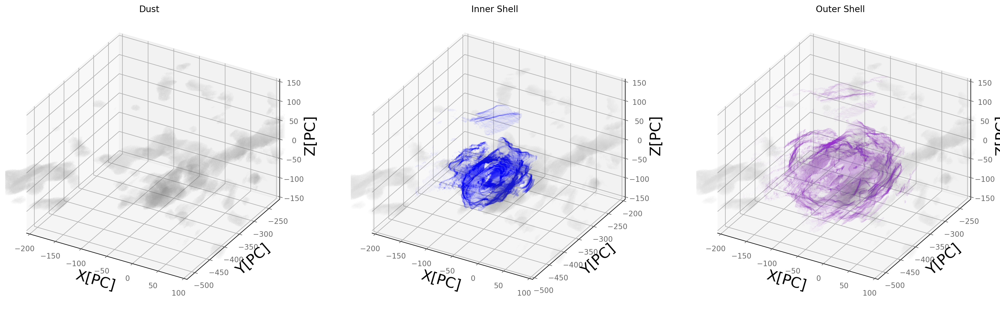

In [377]:
# fig, axs = plt.subplots(1, 3, sharex=True, sharey=True, layout="constrained")

fig = plt.figure(figsize=(24, 8)) #figsize =plt.figaspect(0.33333)

ax = fig.add_subplot(1,3,1, projection='3d',proj_type = 'ortho')
ax.scatter3D(t_dust['x[pc]'],t_dust['y[pc]'], t_dust['z[pc]'], s=0.05, c= 'gray', alpha=0.05)
ax.set_xlim(-200,100)
ax.set_ylim(-520,-220)
ax.set_zlim(-150,150)
ax.set_title("Dust")
ax.set_xlabel("X[PC]")
ax.set_ylabel("Y[PC]")
ax.set_zlabel("Z[PC]")

ax = fig.add_subplot(1,3,2, projection='3d',proj_type = 'ortho')
ax.scatter3D(t_dust['x[pc]'],t_dust['y[pc]'], t_dust['z[pc]'], s=0.02, c= 'gray', alpha=0.05)
ax.scatter3D(ivs['x[pc]'], ivs['y[pc]'].values, ivs['z[pc]'].values, s=0.05, c= 'blue', alpha=0.05)
ax.set_xlim(-200,100)
ax.set_ylim(-500,-200)
ax.set_zlim(-150,150)
ax.set_title("Inner Shell")
ax.set_xlabel("X[PC]")
ax.set_ylabel("Y[PC]")
ax.set_zlabel("Z[PC]")

ax = fig.add_subplot(1,3,3, projection='3d',proj_type = 'ortho')
ax.scatter3D(t_dust['x[pc]'],t_dust['y[pc]'], t_dust['z[pc]'], s=0.02, c= 'gray', alpha=0.05)
ax.scatter3D(outer['x[pc]'], outer['y[pc]'].values, outer['z[pc]'].values,s=0.05, c= 'darkorchid', alpha=0.05)
ax.set_xlim(-200,100)
ax.set_ylim(-520,-220)
ax.set_zlim(-150,150)
ax.set_title("Outer Shell")
ax.set_xlabel("X[PC]")
ax.set_ylabel("Y[PC]")
ax.set_zlabel("Z[PC]")

## <font color='9357C2'>Inflection point that defines inner and outer boundary</font>

In [2]:
density_lines_orig = pd.read_csv('/Users/anniegao/Documents/dustmaps_files/Dust_maps/Edenhofer_map_sketch/new_dustmap/density_lines_edenhofer_Gum_2_350_cut.csv')
density_lines = density_lines_orig*826.670

In [27]:
ivs = pd.read_csv('/Users/anniegao/Dropbox/Gum_Nebula/data/boundary_Gum_edenhofer_center2_new_sigma_650.csv')
outer = pd.read_csv('/Users/anniegao/Dropbox/Gum_Nebula/data/outer_boundary_350_sigma_650.csv')

In [25]:
ivs.iloc[p]['r_raw']

143.4097421203438

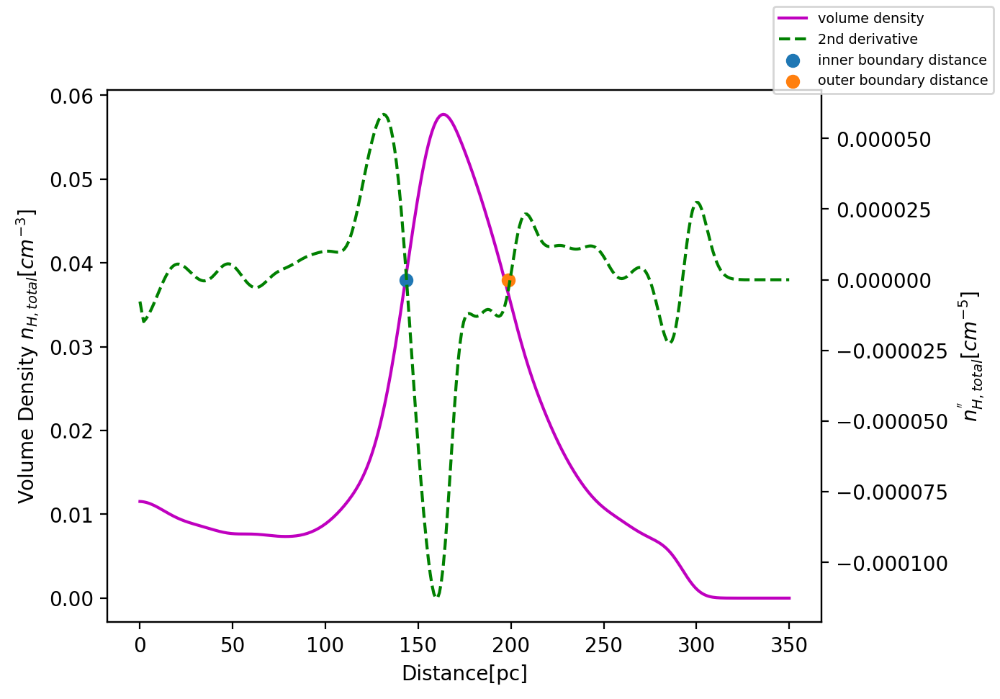

In [86]:
sigma = 7.42857
p = 250
dist = np.linspace(0, 350, 350)
gau_1D_dens = gaussian_filter1d(density_lines[str(p)].tolist(), sigma)
d1 = np.gradient(gau_1D_dens, dist)
d2 = np.gradient(d1,dist)


fig, ax1 = plt.subplots()
ax1.set_xlabel('Distance[pc]')
ax1.set_ylabel('Volume Density $n_{H,total}[cm^{-3}]$')
ax1.plot(dist, gau_1D_dens, 'm', label='volume density')

ax2 = ax1.twinx()
ax2.set_ylabel('$n^{\'\'}_{H,total}[cm^{-5}]$')
# plt.plot(dist, d1*20, 'r', label='1st derivative*20')
ax2.plot(dist, d2, 'g',ls = '--', label='2nd derivative')

# plt.axhline(0)

ax2.scatter(ivs.iloc[p]['r_raw'], 0, label='inner boundary distance')
ax2.scatter(outer.iloc[p]['r_raw'], 0, label='outer boundary distance')
fig.legend(loc='upper right', fontsize='x-small')
# plt.grid()
plt.show()

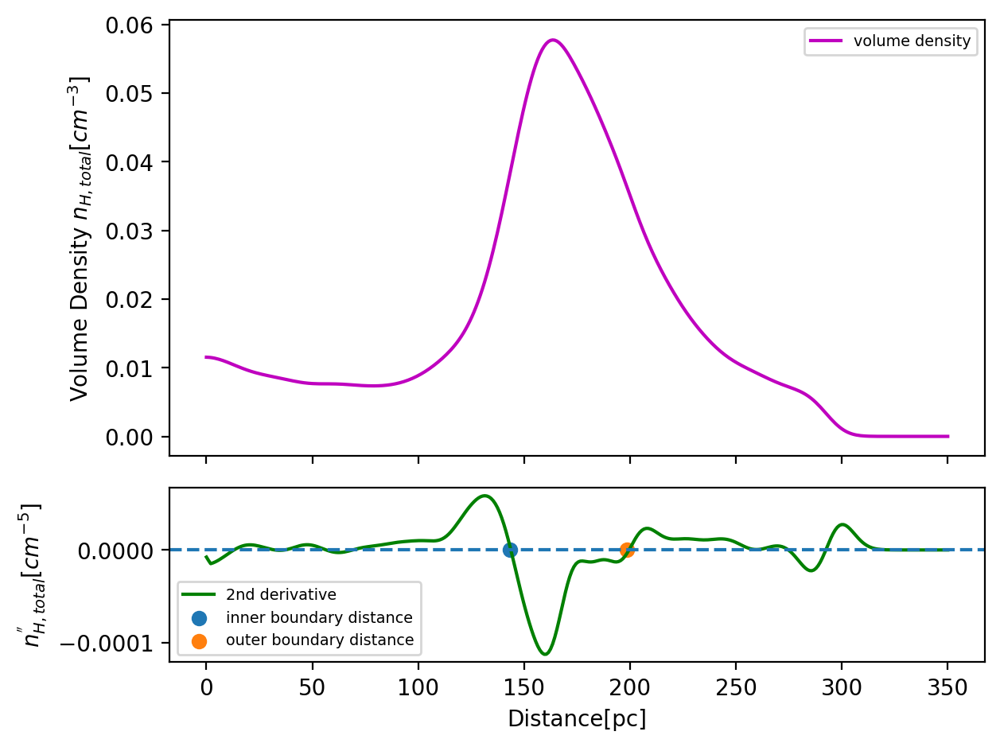

In [87]:
fig, axs = plt.subplots(2, sharex= True, gridspec_kw={'height_ratios': [5, 2]})
plt.xlabel('Distance[pc]')
axs[0].set_ylabel('Volume Density $n_{H,total}[cm^{-3}]$')
axs[0].plot(dist, gau_1D_dens, 'm', label='volume density')
axs[0].legend(fontsize='x-small')
axs[1].set_ylabel('$n^{\'\'}_{H,total}[cm^{-5}]$')
axs[1].plot(dist, d2, 'g', label='2nd derivative')
axs[1].scatter(ivs.iloc[p]['r_raw'], 0, label='inner boundary distance')
axs[1].scatter(outer.iloc[p]['r_raw'], 0, label='outer boundary distance')
axs[1].axhline(0, ls='--')
axs[1].legend(fontsize='x-small')
fig.tight_layout()

## <font color='1E90FF'>4- 3D dust and Vela shell </font>

## <font color='9357C2'>IRAS Vela Shell</font>

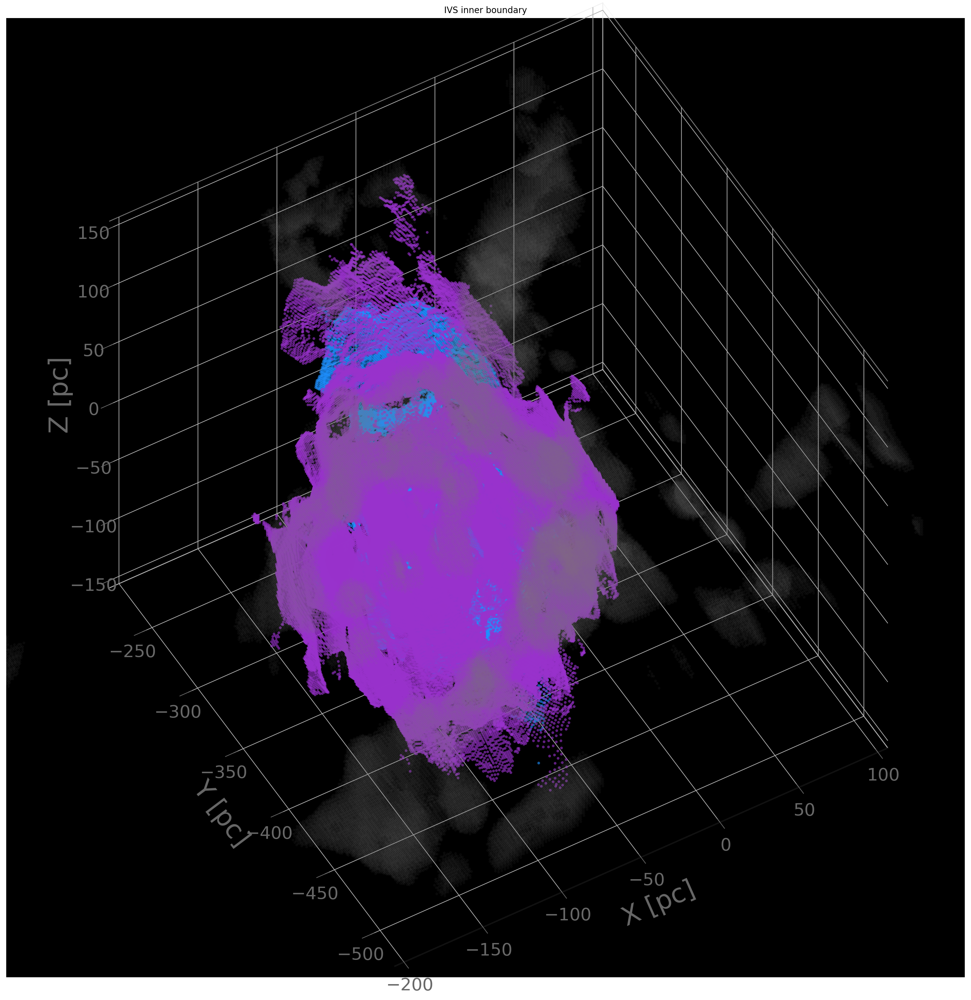

In [328]:
%matplotlib inline

from matplotlib import cm
from matplotlib.colors import Normalize
import matplotlib.colors as colors
from matplotlib import rcParams

rcParams['xtick.color'] = '#686868'
rcParams['ytick.color'] = '#686868'

fig = plt.figure(figsize = (20,20))
ax = plt.axes(projection='3d',proj_type = 'ortho')
ax.set_facecolor("black")
ax.set_title('IVS inner boundary', fontsize=10)
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False


ax.set_xlabel("X [pc]",fontsize=30,color='#686868')
ax.set_ylabel("Y [pc]",fontsize=30,color='#686868')
ax.set_zlabel("Z [pc]",fontsize=30,color='#686868')

ax.set_xlim(-200,100)
ax.set_ylim(-520,-220)
ax.set_zlim(-150,150)

ax.xaxis.set_tick_params(labelsize = 20, direction = 'out', which='major')
ax.yaxis.set_tick_params(labelsize = 20, direction = 'out', which='major')
ax.zaxis.set_tick_params(labelsize = 20, direction = 'out', which='major')
    
ax.xaxis.labelpad=15
ax.yaxis.labelpad=15
ax.zaxis.labelpad=15

ax.view_init(50, -120)

# t_dust = pd.read_csv('/Users/anniegao/Documents/GBO/plots/gum_dust.csv') #dust map
ax.scatter3D(t_dust['x[pc]'],t_dust['y[pc]'], t_dust['z[pc]'],alpha=0.05,c='gray',s=5,zorder=2,rasterized=True) #'lightgray'

# ivs = pd.read_csv('/Users/anniegao/Dropbox/Gum_Nebula/data/boundary_Gum_edenhofer_center2_new_sigma_650.csv')
ax.scatter3D(ivs['x[pc]'], ivs['y[pc]'].values, ivs['z[pc]'].values, alpha=0.5, c='dodgerblue',s=5,zorder=1,rasterized=True)

# outer = pd.read_csv('/Users/anniegao/Dropbox/Gum_Nebula/data/outer_boundary_350_sigma_650.csv')
ax.scatter3D(outer['x[pc]'], outer['y[pc]'].values, outer['z[pc]'].values, alpha=0.5, c='darkorchid',s=5,zorder=1,rasterized=True)


ax.set_aspect('equal')
plt.show()
# plt.savefig("/Users/anniegao/Documents/GBO/plots/3D_gum.png",bbox_inches='tight',dpi=300)

## <font color='9357C2'>IRAS Vela Shell: interactive figures</font>

In [348]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go
from astropy.table import Table
import webcolors
from plotly.offline import plot
import glob
import matplotlib.colors as colors
from matplotlib import cm
from matplotlib.colors import Normalize
import matplotlib
from astropy.table import vstack
import glob
import math
import itertools
import os
DEFAULT_FONT = 'Arial, sans-serif'

import plotly.io as plt_io

# create our custom_dark theme from the plotly_dark template
plt_io.templates["custom_dark"] = plt_io.templates["plotly_dark"]

# set the paper_bgcolor and the plot_bgcolor to a new color
plt_io.templates["custom_dark"]['layout']['paper_bgcolor'] = 'black'
plt_io.templates["custom_dark"]['layout']['plot_bgcolor'] = 'black'

# you may also want to change gridline colors if you are modifying background
plt_io.templates['custom_dark']['layout']['yaxis']['gridcolor'] = 'black'
plt_io.templates['custom_dark']['layout']['xaxis']['gridcolor'] = 'black'


data = []

# make figure
fig_dict = {
    "data": [],
    "layout": {}}

fig_dict['layout'] = go.Layout(
    margin=dict(r=50, l=50, b=50, t=50),
    width=1000,
    scene=dict(
        xaxis=dict(
            title='X [pc]',
            titlefont=dict(
                family=DEFAULT_FONT,
                size=20,
                color='#686868'
            ),
            showspikes=False,
            showgrid=True,
            showline=True,
            backgroundcolor='black',
            gridcolor='#303030',
            zerolinecolor='#303030',
            showticklabels=True,
            tickfont=dict(
                family=DEFAULT_FONT,
                size=12,
                color='#686868'),
            range=[-200,100]),
        yaxis=dict(
            title='Y [pc]',
            titlefont=dict(
                family=DEFAULT_FONT,
                size=20,
                color='#686868'), #'#a9a9a9'
            showspikes=False,
            showgrid=True,
            showline=False,
            zerolinecolor='#303030',
            backgroundcolor='black',
            gridcolor='#303030',
            range=[-500,-200],
            showticklabels=True,
            tickfont=dict(
                family=DEFAULT_FONT,
                size=12,
                color='#686868'),
        ),
        zaxis=dict(
            title='Z [pc]',
            titlefont=dict(
                family=DEFAULT_FONT,
                size=20,
                color='#686868'),
            showspikes=False,
            showgrid=True,
            showline=False,
            zerolinecolor='gold',
            zerolinewidth=5,
            backgroundcolor='black',
            gridcolor='#303030',
            range=[-180,150],
            showticklabels=True,
            tickfont=dict(
                family=DEFAULT_FONT,
                size=12,
                color='#686868'),
        ),
        aspectratio=dict(x=1*1.65, y=1*1.65,z=0.75*1.65),))


In [349]:
%%capture
dustlayer = go.Scatter3d(x = t_dust['x[pc]'],
                            y = t_dust['y[pc]'],
                            z = t_dust['z[pc]'],
                            mode="markers",
                            marker = dict(size = 5, color = 'gray'),
                            opacity=0.01,
                            showlegend=True,
                            visible = True,
#                             legendgroup='dust',
                            hoverinfo='skip',
                            name=r'3D Dust')
fig_dict['data'].append(dustlayer)

In [350]:
%%capture
shell_in = go.Scatter3d(x = ivs['x[pc]'],
                            y = ivs['y[pc]'],
                            z = ivs['z[pc]'],
                            mode="markers",
                            marker = dict(size = 3, color = 'dodgerblue'),
                            opacity=0.01,
                            showlegend=True,
                            visible = True,
#                             legendgroup='shell_in',
                            hoverinfo='skip',
                            name='Inner shell')
fig_dict['data'].append(shell_in)

In [351]:
%%capture
shell_out = go.Scatter3d(x = outer['x[pc]'],
                            y = outer['y[pc]'],
                            z = outer['z[pc]'],
                            mode="markers",
                            marker = dict(size = 3, color = 'darkorchid'),
                            opacity=0.01,
                            showlegend=True,
                            visible = True,
#                             legendgroup='shell_in',
                            hoverinfo='skip',
                            name='Outer shell')
fig_dict['data'].append(shell_out)

In [352]:
fig = go.Figure(fig_dict)
fig.update_layout(showlegend = True, template = 'custom_dark')
fig.layout.legend.font.size = 14
fig.layout.legend.font.color = 'white'
fig.layout.legend.title='Click to Show/Hide:'
fig.layout.legend.title.side='top'
fig.layout.legend.title.font.size=22
fig.update_layout(legend= {'itemsizing': 'constant'})

camera = dict(
    up=dict(x=0, y=0, z=1),
    eye = {'x': -1.25, 'y': -2.0, 'z': 1.25},

    projection=dict(type='orthographic')
)

fig.update_layout(scene_camera=camera)
fig.write_html('first_figure.html', auto_open=True)

# plot(fig, filename='3D_Dust_Cloud.html', auto_open=False, auto_play=False)

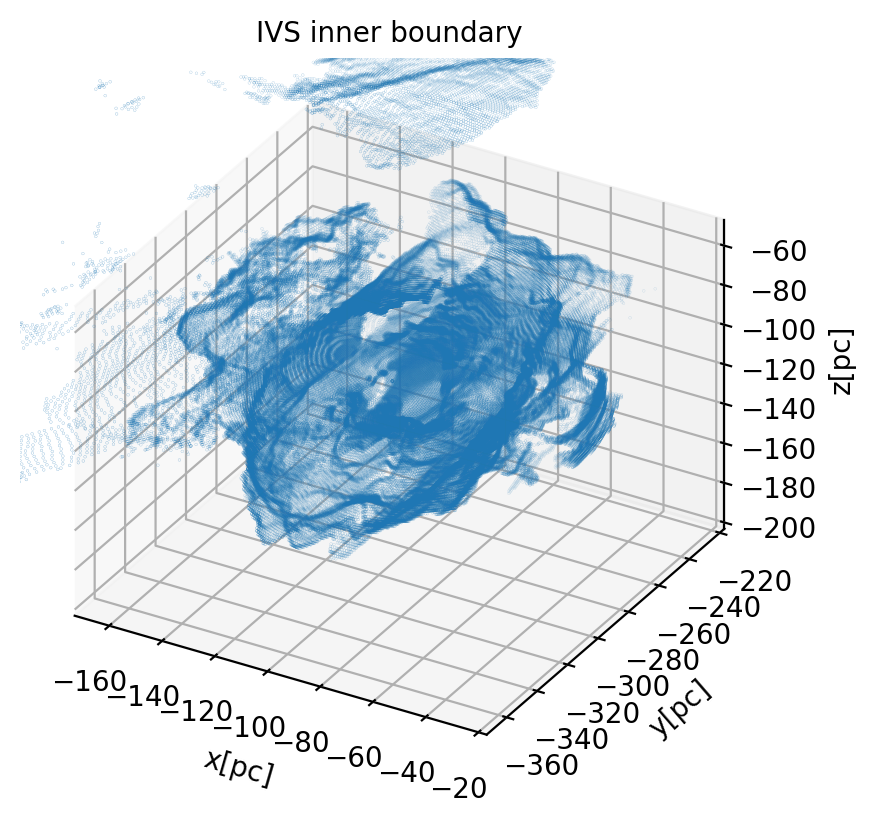

In [148]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
X, Y, Z = ivs['x[pc]'], ivs['y[pc]'].values, ivs['z[pc]'].values
ax.scatter(X, Y, Z, s=0.005)
ax.set_proj_type('ortho')
ax.set_title('IVS inner boundary', fontsize=10)
ax.set_xlim(-170, -20)
ax.set_ylim(-370, -220)
ax.set_zlim(-200, -50)
ax.set_xlabel('x[pc]')
ax.set_ylabel('y[pc]')
ax.set_zlabel('z[pc]')
# ax.set_aspect('equal')
plt.show()